**Objective**

Apply Support Vector Machine algorithm to a well recognized Mushroom Dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sea

**Task 1: Exploratory Data Analysis (EDA)**

* Load the Mushroom dataset and perform fundamental data exploration.
* Utilize histograms, box plots, or density plots to understand feature distributions.
* Investigate feature correlations to discern relationships within the data.

In [ ]:
# Load the dataset
mushroom_data = pd.read_csv('/content/mushroom.csv')
mushroom_data

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1996,1160,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,...,partial,white,one,zone,yellow,numerous,waste,poisonous,6.500840,13.501957
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020
1998,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199


In [ ]:
# Get some basic info about the given dataset
mushroom_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                2000 non-null   int64  
 1   cap_shape                 2000 non-null   object 
 2   cap_surface               2000 non-null   object 
 3   cap_color                 2000 non-null   object 
 4   bruises                   2000 non-null   object 
 5   odor                      2000 non-null   object 
 6   gill_attachment           2000 non-null   object 
 7   gill_spacing              2000 non-null   object 
 8   gill_size                 2000 non-null   object 
 9   gill_color                2000 non-null   object 
 10  stalk_shape               2000 non-null   object 
 11  stalk_root                2000 non-null   object 
 12  stalk_surface_above_ring  2000 non-null   object 
 13  stalk_surface_below_ring  2000 non-null   object 
 14  stalk_co

In [ ]:
# Check for duplicates
mushroom_data[mushroom_data.duplicated()]

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
34,1279,bell,smooth,pink,no,foul,notched,distant,broad,pink,...,universal,brown,one,zone,black,scattered,leaves,poisonous,5.291009,5.436304
70,1275,sunken,scaly,yellow,no,pungent,descending,distant,narrow,orange,...,partial,white,none,zone,white,numerous,leaves,poisonous,4.746453,10.769935
76,549,conical,grooves,brown,no,foul,free,distant,broad,white,...,partial,yellow,two,large,chocolate,solitary,woods,poisonous,12.206952,5.061715
109,1198,sunken,smooth,white,no,anise,attached,crowded,broad,black,...,partial,brown,two,sheathing,black,solitary,woods,edible,13.214007,14.549171
127,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,618,flat,grooves,green,yes,musty,notched,crowded,broad,chocolate,...,universal,yellow,one,zone,brown,abundant,meadows,poisonous,14.834383,2.053744
1994,871,flat,scaly,pink,no,spicy,attached,distant,narrow,red,...,universal,brown,two,zone,brown,abundant,meadows,poisonous,4.794826,4.576464
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020


In [ ]:
# Verify for duplicates: Test 1
mushroom_data[(mushroom_data['Unnamed: 0'] == 1279) & (mushroom_data['stalk_root'] == 'rooted')]

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
16,1279,bell,smooth,pink,no,foul,notched,distant,broad,pink,...,universal,brown,one,zone,black,scattered,leaves,poisonous,5.291009,5.436304
34,1279,bell,smooth,pink,no,foul,notched,distant,broad,pink,...,universal,brown,one,zone,black,scattered,leaves,poisonous,5.291009,5.436304
1599,1279,bell,smooth,pink,no,foul,notched,distant,broad,pink,...,universal,brown,one,zone,black,scattered,leaves,poisonous,5.291009,5.436304
1765,1279,bell,smooth,pink,no,foul,notched,distant,broad,pink,...,universal,brown,one,zone,black,scattered,leaves,poisonous,5.291009,5.436304


4 rows are duplicates for in the above tested case

In [ ]:
# Verify for duplicates: Test 2
mushroom_data[(mushroom_data['Unnamed: 0'] == 411)]

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
1788,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199
1978,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199
1998,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199


In [ ]:
# Check for missing data entries
mushroom_data.isna().sum()

,0
Unnamed: 0,0
cap_shape,0
cap_surface,0
cap_color,0
bruises,0
odor,0
gill_attachment,0
gill_spacing,0
gill_size,0
gill_color,0


<Axes: xlabel='stalk_height', ylabel='Count'>

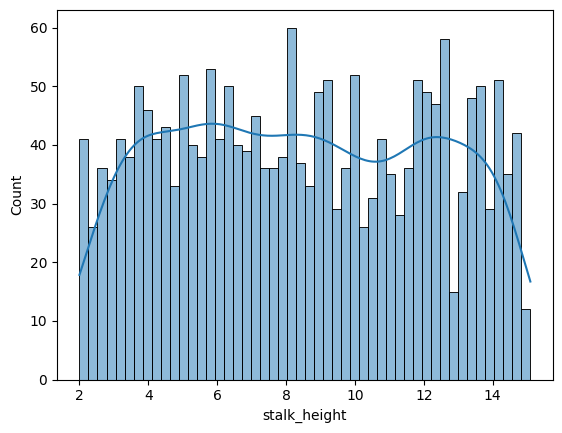

In [ ]:
# Histagram of numerical features: 'stalk_height'
sea.histplot(mushroom_data['stalk_height'], kde = True, bins = 50)

<Axes: xlabel='cap_diameter', ylabel='Count'>

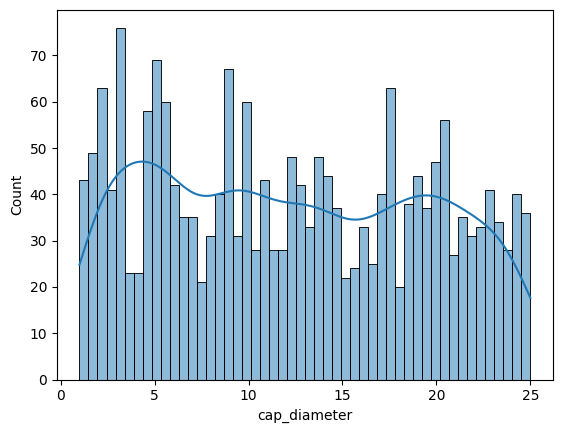

In [ ]:
# Histagram of numerical features: 'cap_diameter'
sea.histplot(mushroom_data['cap_diameter'], kde = True, bins = 50)

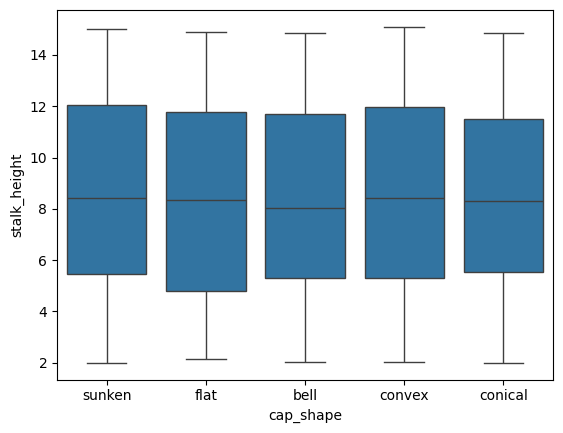

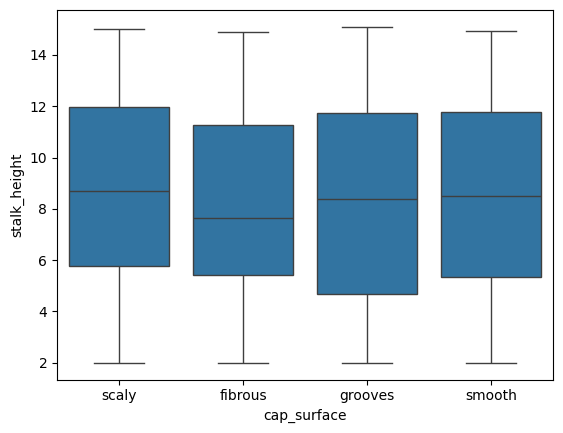

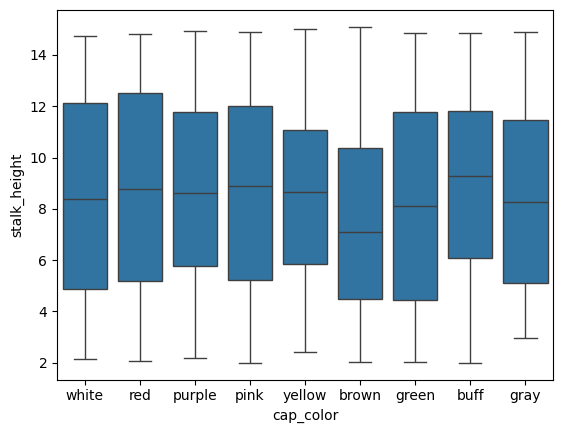

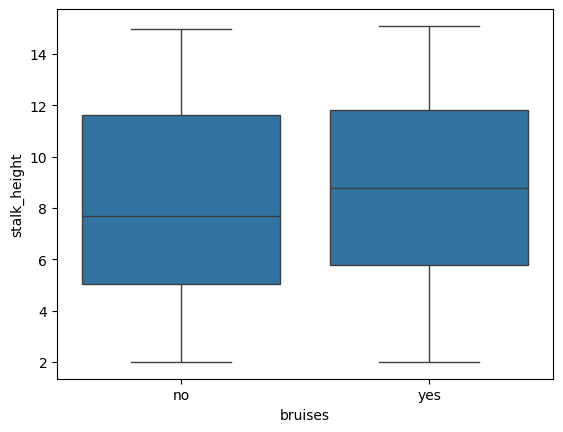

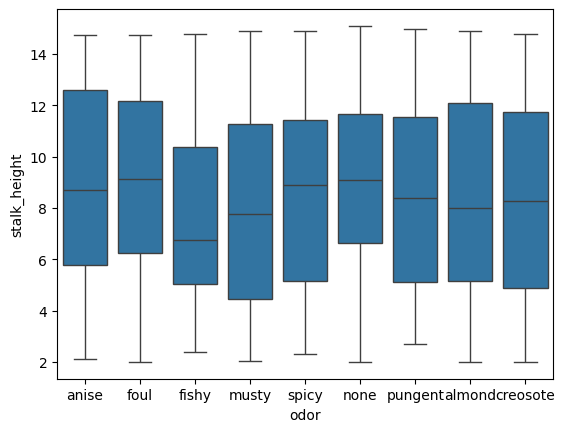

...

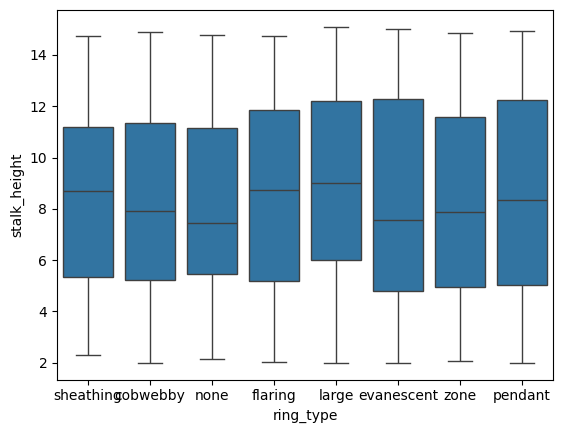

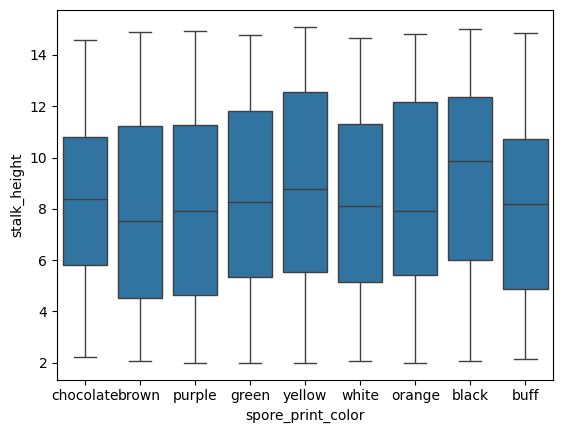

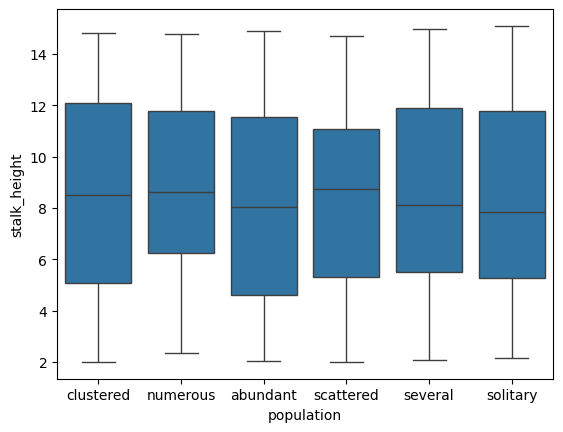

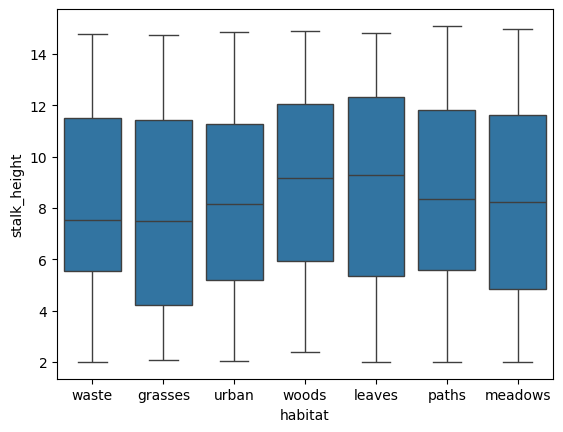

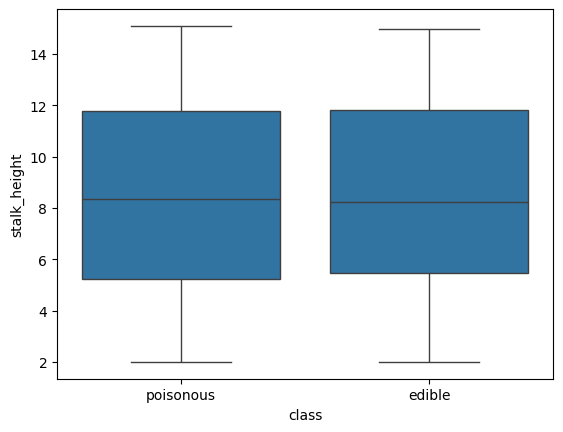

In [ ]:
# Box plot bewteen categorical and numerical data (features)
for c in mushroom_data.columns:
  if mushroom_data[c].dtype == 'object':
    sea.boxplot(x = c, y = 'stalk_height', data = mushroom_data)
    plt.show()

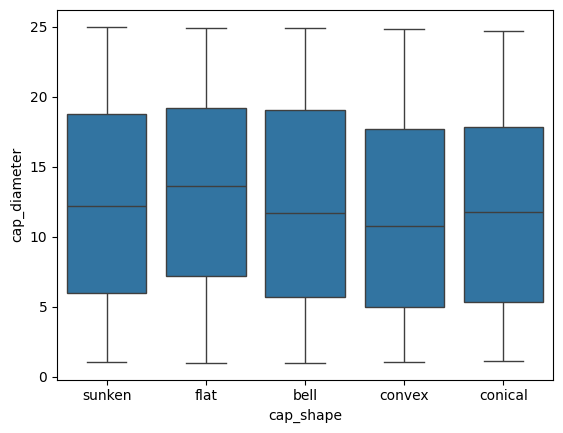

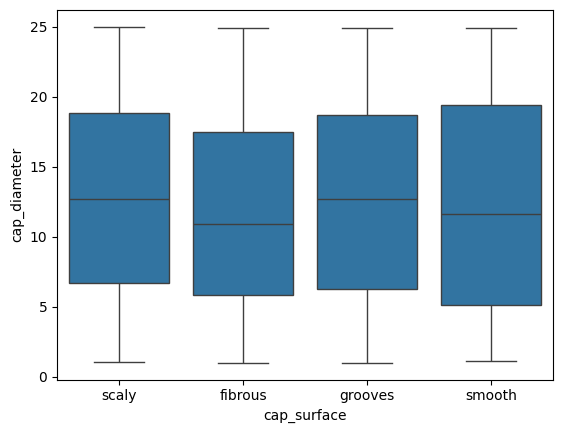

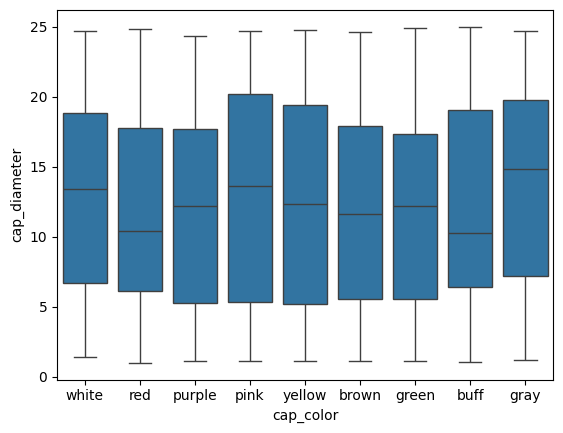

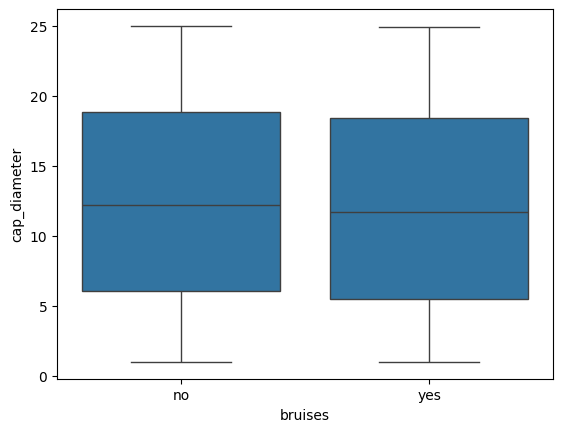

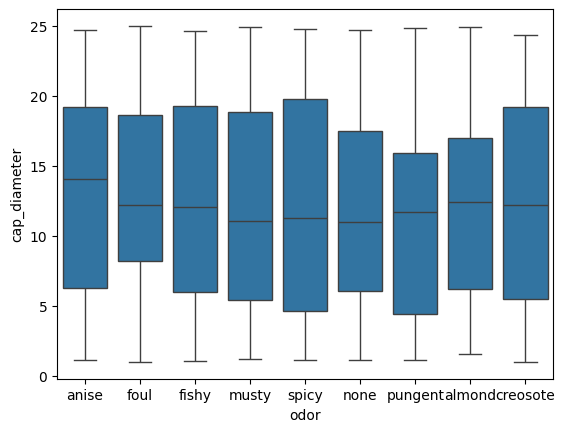

...

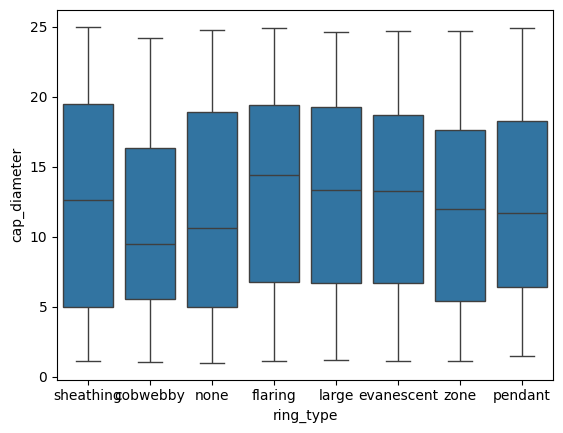

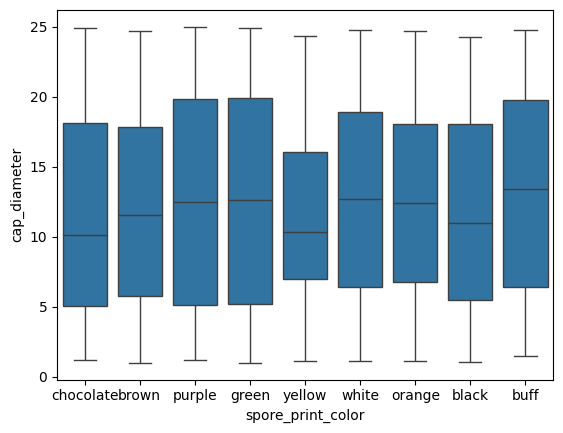

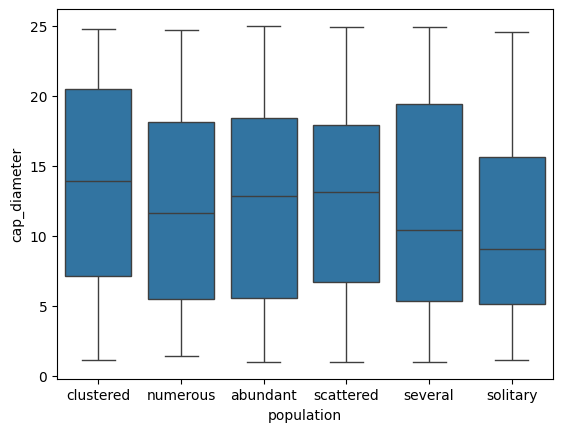

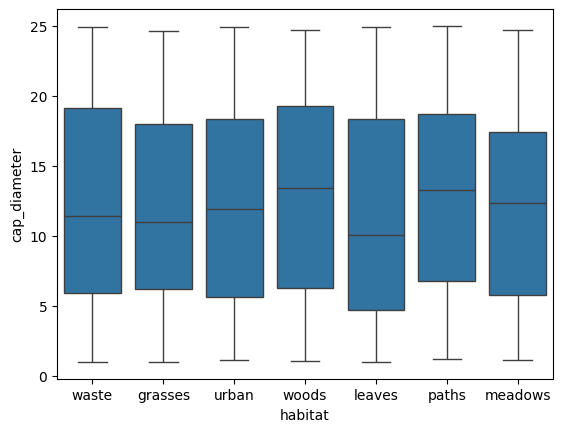

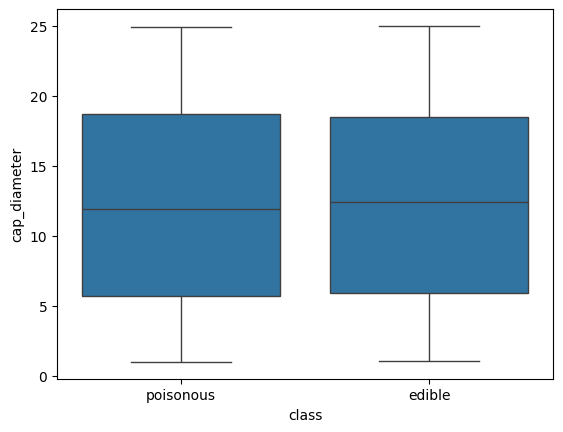

In [ ]:
for c in mushroom_data.columns:
  if mushroom_data[c].dtype == 'object':
    sea.boxplot(x = c, y = 'cap_diameter', data = mushroom_data)
    plt.show()

In [ ]:
print('\nFeature : stalk_height\n')
print(mushroom_data['stalk_height'].mean())
print(mushroom_data['stalk_height'].median())
print(mushroom_data['stalk_height'].mode())
print('\nFeature : cap_diameter\n')
print(mushroom_data['cap_diameter'].mean())
print(mushroom_data['cap_diameter'].median())
print(mushroom_data['cap_diameter'].mode())


Feature : stalk_height

8.44911804190226
8.318595882841752
0    2.0
Name: stalk_height, dtype: float64

Feature : cap_diameter

12.314344784177193
12.124901573693194
0    3.111415
1    4.988930
Name: cap_diameter, dtype: float64


Based on the boxplots of different categorical features vs numerical features  'stalk_height' and 'cap_diameter', the spread of data is uniform acorss different labels. The same can be seen in the histagram, although there are some outliers, they appear to have less impact on the global factors like mean and median.

**Task 3: Data Visualization**

* Employ scatter plots, pair plots, or relevant visualizations to comprehend feature distributions and relationships.
* Visualize class distributions to gauge dataset balance or imbalance.

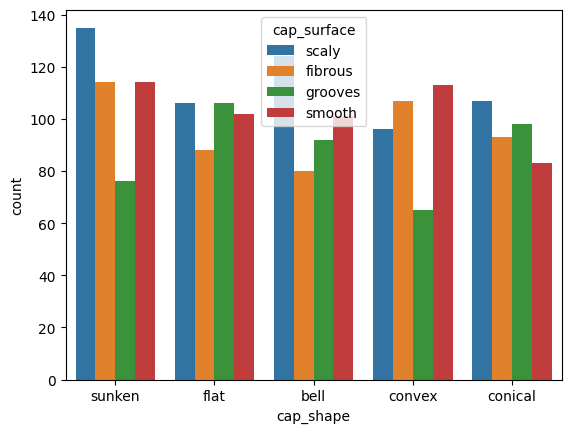

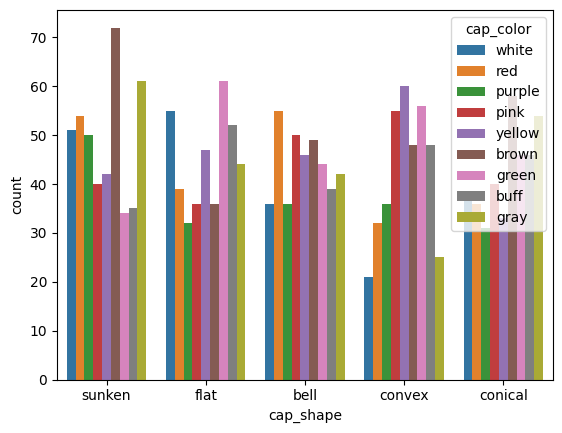

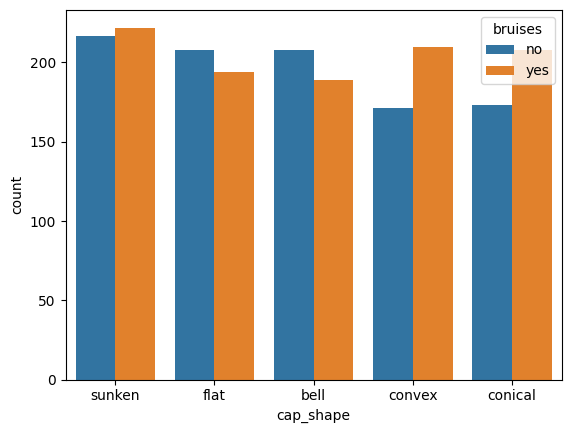

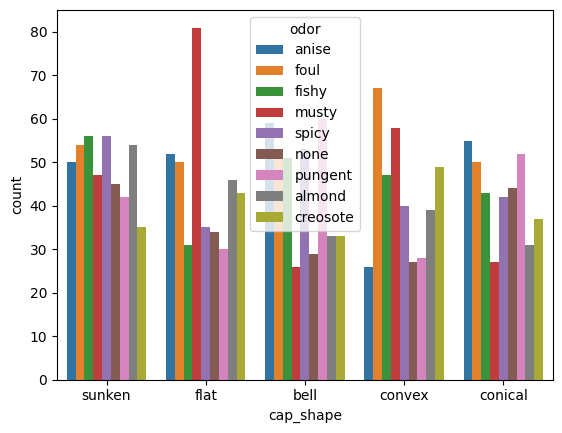

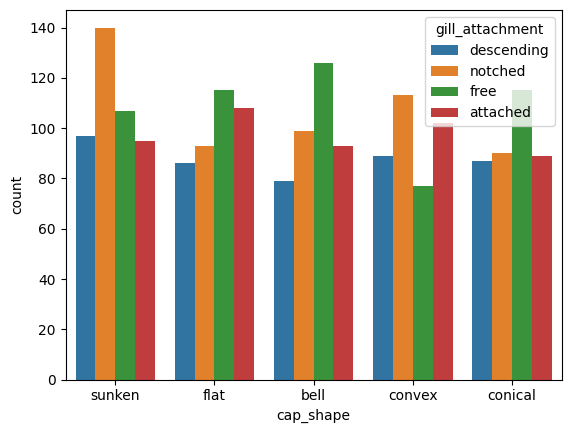

...

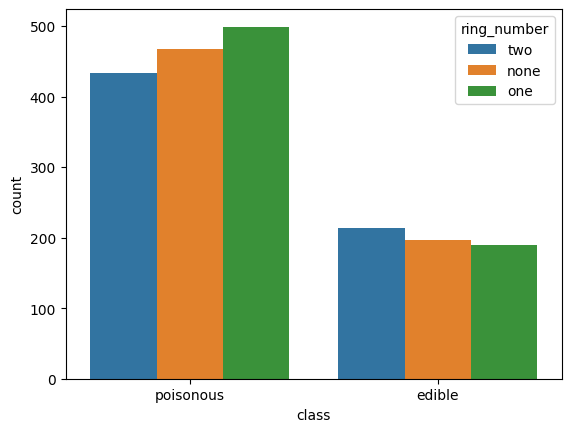

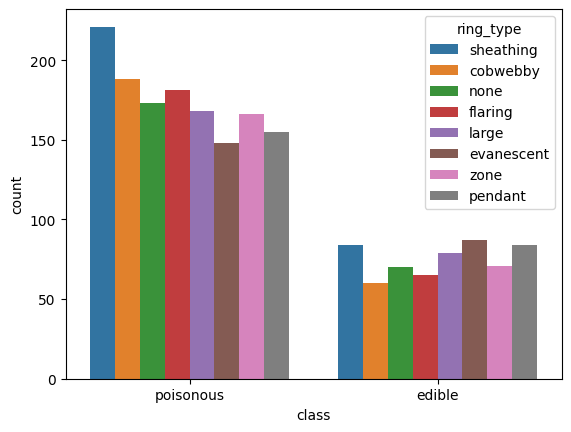

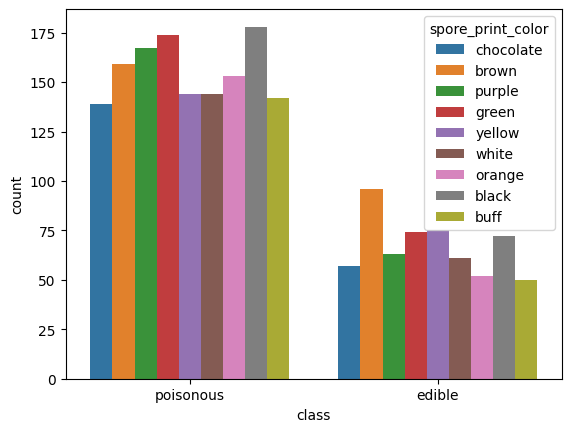

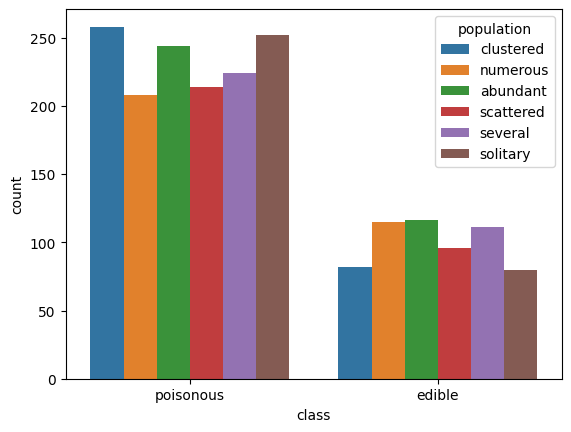

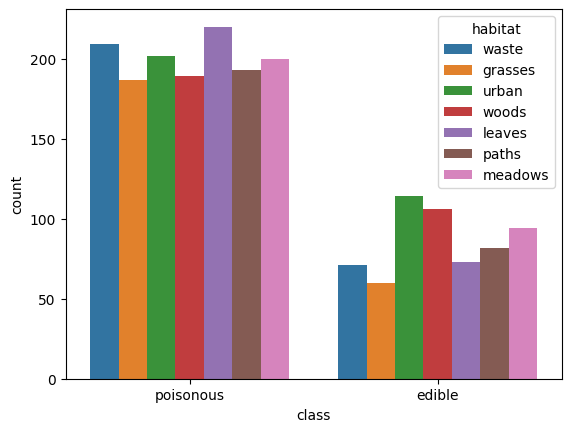

In [ ]:
# Plotting categorical data vs categorical data, similar to pairplots but for categorical features.
for c1 in mushroom_data.columns:
  if mushroom_data[c1].dtype == 'object':
    for c2 in mushroom_data.columns:
      if mushroom_data[c2].dtype == 'object' and c1 != c2:
        sea.countplot(x = c1, hue = c2, data = mushroom_data)
        plt.show()

The seaborn countplot shows the count in the y-axis for each label of x-axis. It is interesting that there are more poisonous mushrooms compared to edible ones. It will be interesting to apply Lable or OneHot Encoding to these features and gain more insights mushroom classifications.

**Task 2: Data Preprocessing**

* Encode categorical variables if necessary.
* Split the dataset into training and testing sets.

In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split as tts

In [ ]:
for c in mushroom_data.columns:
  if mushroom_data[c].dtype == 'object' and mushroom_data[c].nunique() > 2:
    mushroom_data[c] = LabelEncoder().fit_transform(mushroom_data[c])
  elif mushroom_data[c].dtype == 'object' and mushroom_data[c].nunique() < 3:
    print(c, mushroom_data[c].unique())
print(mushroom_data.head(5))

bruises ['no' 'yes']
gill_size ['broad' 'narrow']
stalk_shape ['tapering' 'enlarging']
veil_type ['partial' 'universal']
class ['poisonous' 'edible']
   Unnamed: 0  cap_shape  cap_surface  cap_color bruises  odor  \
0        1167          4            2          7      no     1   
1        1037          4            0          6      no     1   
2         309          3            1          5     yes     4   
3         282          0            2          4     yes     3   
4         820          3            3          8     yes     5   

   gill_attachment  gill_spacing gill_size  gill_color  ...  veil_type  \
0                1             2     broad           7  ...    partial   
1                3             1    narrow           3  ...  universal   
2                1             1     broad           8  ...  universal   
3                3             0     broad           6  ...    partial   
4                2             1    narrow           6  ...  universal   

   veil_

In [ ]:
mushroom_data_encode = mushroom_data.copy()
mushroom_data_encode.drop(columns = ['Unnamed: 0', 'bruises', 'gill_size', 'stalk_shape', 'veil_type', 'class'], inplace = True)
mushroom_data_encode

,cap_shape,cap_surface,cap_color,odor,gill_attachment,gill_spacing,gill_color,stalk_root,stalk_surface_above_ring,stalk_surface_below_ring,stalk_color_above_ring,stalk_color_below_ring,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
0,4,2,7,1,1,2,7,2,3,2,3,8,0,2,6,3,1,5,14.276173,5.054983
1,4,0,6,1,3,1,3,6,2,2,2,0,0,2,6,1,2,5,3.952715,19.068319
2,3,1,5,4,1,1,8,2,1,2,8,3,3,2,6,6,0,5,9.054265,7.205884
3,0,2,4,3,3,0,6,1,3,1,8,5,3,2,0,4,1,0,5.226499,20.932692
4,3,3,8,5,2,1,6,4,0,1,3,7,2,0,4,8,1,4,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,4,2,0,4,0,1,3,0,2,2,5,4,1,1,2,6,0,1,5.877891,17.464145
1996,4,2,5,5,0,2,9,5,0,0,5,4,2,1,7,8,2,5,6.500840,13.501957
1997,2,1,3,3,3,0,7,4,3,2,0,6,0,2,1,8,0,6,13.558064,11.270020
1998,0,3,7,7,2,0,6,6,1,0,3,5,3,1,0,1,5,6,11.092703,8.423199


In [ ]:
oh_df = pd.DataFrame()
oh_encode = OneHotEncoder(drop = 'first')
oh_bruises = oh_encode.fit_transform(mushroom_data[['bruises']]).toarray()
oh_df['bruises'] = oh_bruises[:,0]
oh_gill_size = oh_encode.fit_transform(mushroom_data[['gill_size']]).toarray()
oh_df['gill_size'] = oh_gill_size[:,0]
oh_veil_type = oh_encode.fit_transform(mushroom_data[['veil_type']]).toarray()
oh_df['veil_type'] = oh_veil_type[:,0]
oh_class = oh_encode.fit_transform(mushroom_data[['class']]).toarray()
oh_df['class'] = oh_class[:,0]
oh_stalk_shape = oh_encode.fit_transform(mushroom_data[['stalk_shape']]).toarray()
oh_df['stalk_shape'] = oh_stalk_shape[:,0]
oh_df.head()

,bruises,gill_size,veil_type,class,stalk_shape
0,0.0,0.0,0.0,1.0,1.0
1,0.0,1.0,1.0,0.0,0.0
2,1.0,0.0,1.0,1.0,1.0
3,1.0,0.0,0.0,1.0,0.0
4,1.0,1.0,1.0,1.0,0.0


In [ ]:
mushroom_data_encode = pd.concat([mushroom_data_encode, oh_df], axis = 1)
mushroom_data_encode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   cap_shape                 2000 non-null   int64  
 1   cap_surface               2000 non-null   int64  
 2   cap_color                 2000 non-null   int64  
 3   odor                      2000 non-null   int64  
 4   gill_attachment           2000 non-null   int64  
 5   gill_spacing              2000 non-null   int64  
 6   gill_color                2000 non-null   int64  
 7   stalk_root                2000 non-null   int64  
 8   stalk_surface_above_ring  2000 non-null   int64  
 9   stalk_surface_below_ring  2000 non-null   int64  
 10  stalk_color_above_ring    2000 non-null   int64  
 11  stalk_color_below_ring    2000 non-null   int64  
 12  veil_color                2000 non-null   int64  
 13  ring_number               2000 non-null   int64  
 14  ring_typ

In [ ]:
mushroom_data_encode[mushroom_data_encode.duplicated()]

,cap_shape,cap_surface,cap_color,odor,gill_attachment,gill_spacing,gill_color,stalk_root,stalk_surface_above_ring,stalk_surface_below_ring,...,spore_print_color,population,habitat,stalk_height,cap_diameter,bruises,gill_size,veil_type,class,stalk_shape
34,0,3,4,4,3,2,7,6,3,0,...,0,3,1,5.291009,5.436304,0.0,0.0,1.0,1.0,0.0
70,4,2,8,7,1,2,6,6,0,0,...,7,2,1,4.746453,10.769935,0.0,1.0,0.0,1.0,0.0
76,1,1,0,4,2,2,10,6,3,0,...,3,5,6,12.206952,5.061715,0.0,0.0,0.0,1.0,1.0
109,4,3,7,1,0,1,0,0,1,1,...,0,5,6,13.214007,14.549171,0.0,0.0,0.0,0.0,1.0
127,4,2,7,1,1,2,7,2,3,2,...,3,1,5,14.276173,5.054983,0.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,3,1,3,5,3,1,3,0,1,0,...,1,0,2,14.834383,2.053744,1.0,0.0,1.0,1.0,0.0
1994,3,2,4,8,0,2,9,0,2,3,...,1,0,2,4.794826,4.576464,0.0,1.0,1.0,1.0,0.0
1995,4,2,0,4,0,1,3,0,2,2,...,6,0,1,5.877891,17.464145,1.0,1.0,0.0,1.0,1.0
1997,2,1,3,3,3,0,7,4,3,2,...,8,0,6,13.558064,11.270020,1.0,1.0,0.0,1.0,1.0


In [ ]:
no_duplicates_data = mushroom_data_encode.drop_duplicates()
no_duplicates_data

,cap_shape,cap_surface,cap_color,odor,gill_attachment,gill_spacing,gill_color,stalk_root,stalk_surface_above_ring,stalk_surface_below_ring,...,spore_print_color,population,habitat,stalk_height,cap_diameter,bruises,gill_size,veil_type,class,stalk_shape
0,4,2,7,1,1,2,7,2,3,2,...,3,1,5,14.276173,5.054983,0.0,0.0,0.0,1.0,1.0
1,4,0,6,1,3,1,3,6,2,2,...,1,2,5,3.952715,19.068319,0.0,1.0,1.0,0.0,0.0
2,3,1,5,4,1,1,8,2,1,2,...,6,0,5,9.054265,7.205884,1.0,0.0,1.0,1.0,1.0
3,0,2,4,3,3,0,6,1,3,1,...,4,1,0,5.226499,20.932692,1.0,0.0,0.0,1.0,0.0
4,3,3,8,5,2,1,6,4,0,1,...,8,1,4,14.037532,12.545245,1.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,1,1,0,4,3,1,3,2,3,2,...,1,2,3,13.020616,9.993008,0.0,0.0,1.0,0.0,1.0
1988,0,1,4,1,1,2,1,0,1,0,...,8,2,0,3.751597,18.868135,1.0,0.0,0.0,1.0,0.0
1989,4,3,5,1,1,1,2,1,1,2,...,5,0,0,13.134058,15.740028,1.0,1.0,1.0,0.0,1.0
1996,4,2,5,5,0,2,9,5,0,0,...,8,2,5,6.500840,13.501957,1.0,1.0,0.0,1.0,1.0


**Task 4: SVM Implementation**

* Implement a basic SVM classifier using Python libraries like scikit-learn.
* Train the SVM model on the training data.
* Evaluate model performance on the testing data using appropriate metrics (e.g., accuracy, precision, recall, F1-score).

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [ ]:
x_data = mushroom_data_encode.drop(columns = ['class'])
y_data = mushroom_data_encode['class']
print(x_data.shape, y_data.shape)

(2000, 24) (2000,)


In [ ]:
x_data_no_duplicates = no_duplicates_data.drop(columns = ['class'])
y_data_no_duplicates = no_duplicates_data['class']
print(x_data_no_duplicates.shape, y_data_no_duplicates.shape)

(976, 24) (976,)


In [ ]:
x_train, x_test, y_train, y_test = tts(x_data, y_data, test_size = 0.2, random_state = 42)
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(1600, 24) (1600,) (400, 24) (400,)


In [ ]:
x_train_no_duplicates, x_test_no_duplicates, y_train_no_duplicates, y_test_no_duplicates = tts(x_data_no_duplicates, y_data_no_duplicates, test_size = 0.2, random_state = 42)
print(x_train_no_duplicates.shape, y_train_no_duplicates.shape, x_test_no_duplicates.shape, y_test_no_duplicates.shape)

(780, 24) (780,) (196, 24) (196,)


In [ ]:
std_scale = StandardScaler()
# Scale 'stalk_height' and 'cap_diameter' which are the numerical features
x_train[['stalk_height', 'cap_diameter']] = std_scale.fit_transform(x_train[['stalk_height', 'cap_diameter']])
x_test[['stalk_height', 'cap_diameter']] = std_scale.transform(x_test[['stalk_height', 'cap_diameter']])
x_train.head()

,cap_shape,cap_surface,cap_color,odor,gill_attachment,gill_spacing,gill_color,stalk_root,stalk_surface_above_ring,stalk_surface_below_ring,...,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter,bruises,gill_size,veil_type,stalk_shape
968,4,0,4,7,2,2,6,3,2,1,...,3,4,3,2,0.541283,0.559151,0.0,1.0,0.0,0.0
240,3,0,6,6,2,0,10,6,2,1,...,1,1,2,6,-0.650394,0.401468,1.0,1.0,0.0,0.0
819,1,1,0,3,1,2,11,6,3,2,...,2,4,0,5,-0.486296,-1.042204,0.0,0.0,0.0,1.0
692,4,2,2,4,2,2,2,2,1,0,...,2,7,0,2,-0.064803,0.717781,1.0,1.0,0.0,1.0
420,4,3,7,5,0,1,7,0,1,0,...,0,2,1,0,1.643787,-0.421468,1.0,1.0,1.0,0.0


In [ ]:
x_train_no_duplicates[['stalk_height', 'cap_diameter']] = std_scale.fit_transform(x_train_no_duplicates[['stalk_height', 'cap_diameter']])
x_test_no_duplicates[['stalk_height', 'cap_diameter']] = std_scale.transform(x_test_no_duplicates[['stalk_height', 'cap_diameter']])
x_test_no_duplicates.head()

,cap_shape,cap_surface,cap_color,odor,gill_attachment,gill_spacing,gill_color,stalk_root,stalk_surface_above_ring,stalk_surface_below_ring,...,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter,bruises,gill_size,veil_type,stalk_shape
216,0,3,8,7,0,2,1,1,1,2,...,3,1,3,1,-1.187387,-1.368487,1.0,0.0,1.0,0.0
712,3,0,0,3,1,0,0,2,0,2,...,5,5,5,6,-0.601717,-0.052654,0.0,1.0,1.0,1.0
190,2,3,3,6,3,1,5,3,2,1,...,7,3,4,4,-1.709214,1.519581,1.0,1.0,0.0,0.0
594,1,1,1,2,0,2,8,2,0,1,...,4,7,3,2,-0.064126,0.291269,1.0,0.0,0.0,1.0
67,1,1,3,7,0,0,4,6,1,0,...,0,8,5,2,1.420090,-1.321062,1.0,0.0,1.0,0.0


In [ ]:
# Train SVM : model01
svm_model01 = SVC(kernel = 'linear', C = 1.0, random_state = 42)
svm_model01.fit(x_train, y_train)

SVC(kernel='linear', random_state=42)

In [ ]:
y_pred01 = svm_model01.predict(x_test)

In [ ]:
# Train SVM : Model02 (no duplicates)
svm_model02 = SVC(kernel = 'linear', C = 1.0, random_state = 42)
svm_model02.fit(x_train_no_duplicates, y_train_no_duplicates)
y_pred02 = svm_model02.predict(x_test_no_duplicates)

In [ ]:
# Key metrics: model01
print('Accuracy', round(accuracy_score(y_test, y_pred01), 4))
print('Precision', round(precision_score(y_test, y_pred01), 4))
print('Recall', round(recall_score(y_test, y_pred01), 4))
print('F1-score', round(f1_score(y_test, y_pred01), 4))

Accuracy 0.6675
Precision 0.6675
Recall 1.0
F1-score 0.8006


In [ ]:
# Key metrics : model02
print('Accuracy', round(accuracy_score(y_test_no_duplicates, y_pred02), 4))
print('Precision', round(precision_score(y_test_no_duplicates, y_pred02), 4))
print('Recall', round(recall_score(y_test_no_duplicates, y_pred02), 4))
print('F1-score', round(f1_score(y_test_no_duplicates, y_pred02), 4))

Accuracy 0.6327
Precision 0.6327
Recall 1.0
F1-score 0.775


In both models, Recall metric is perfect, meaning 100% of all positives are perdicted correctly by the models, however, precision is about 66% and 63% in model01 and model02 respectively similar to accuracy. This suggests False positives exists in both models. More fine tuning is required to imporve these models.

**Task 5: Visualization of SVM Results**

* Visualize classification results on the testing data.

**Task 6: Parameter Tuning and Optimization**

* Experiment with different SVM hyperparameters (e.g., kernel type, regularization parameter) to optimize performance.

In [ ]:
# Tune model01
svm_model11 = SVC(kernel = 'linear', class_weight = 'balanced', C = 1.0, random_state = 42)
svm_model11.fit(x_train, y_train)

SVC(class_weight='balanced', kernel='linear', random_state=42)

In [ ]:
y_pred11 = svm_model11.predict(x_test)

In [ ]:
# Key metrics of model11
print('Accuracy', round(accuracy_score(y_test, y_pred11), 4))
print('Precision', round(precision_score(y_test, y_pred11), 4))
print('Recall', round(recall_score(y_test, y_pred11), 4))
print('F1-score', round(f1_score(y_test, y_pred11), 4))

Accuracy 0.54
Precision 0.693
Recall 0.5581
F1-score 0.6183


In [ ]:
# Tune model02
svm_model12 = SVC(kernel = 'linear', class_weight = 'balanced', C = 1.0, random_state = 42)
svm_model12.fit(x_train_no_duplicates, y_train_no_duplicates)

SVC(class_weight='balanced', kernel='linear', random_state=42)

In [ ]:
y_pred12 = svm_model12.predict(x_test_no_duplicates)

In [ ]:
# key metrics of model12
print('Accuracy', round(accuracy_score(y_test_no_duplicates, y_pred12), 4))
print('Precision', round(precision_score(y_test_no_duplicates, y_pred12), 4))
print('Recall', round(recall_score(y_test_no_duplicates, y_pred12), 4))
print('F1-score', round(f1_score(y_test_no_duplicates, y_pred12), 4))

Accuracy 0.551
Precision 0.7
Recall 0.5081
F1-score 0.5888


Including the weight class to both models rectified the False Positives problem, however, the performance of the models are about 55%. Testing other hyperparameters.

In [ ]:
# Tune model11
svm_model21 = SVC(kernel = 'rbf', class_weight = 'balanced', C = 1.0, random_state = 42)
svm_model21.fit(x_train, y_train)

SVC(class_weight='balanced', random_state=42)

In [ ]:
y_pred21 = svm_model21.predict(x_test)

In [ ]:
# Key metrics of model21
print('Accuracy', round(accuracy_score(y_test, y_pred21), 4))
print('Precision', round(precision_score(y_test, y_pred21), 4))
print('Recall', round(recall_score(y_test, y_pred21), 4))
print('F1-score', round(f1_score(y_test, y_pred21), 4))

Accuracy 0.665
Precision 0.7904
Recall 0.6779
F1-score 0.7298


In [ ]:
# Tune model22
svm_model22 = SVC(kernel = 'rbf', class_weight = 'balanced', C = 1.0, random_state = 42)
svm_model22.fit(x_train_no_duplicates, y_train_no_duplicates)

SVC(class_weight='balanced', random_state=42)

In [ ]:
y_pred22 = svm_model22.predict(x_test_no_duplicates)

In [ ]:
# Key metrics of model22
print('Accuracy', round(accuracy_score(y_test_no_duplicates, y_pred22), 4))
print('Precision', round(precision_score(y_test_no_duplicates, y_pred22), 4))
print('Recall', round(recall_score(y_test_no_duplicates, y_pred22), 4))
print('F1-score', round(f1_score(y_test_no_duplicates, y_pred22), 4))

Accuracy 0.4949
Precision 0.6316
Recall 0.4839
F1-score 0.5479


Changing the kernel to 'rbf' improved the accuracy of model11 from 54% to 66% in model21. However, the accuracy of model12 decreased by 6% in model22. A model with duplicates performs better  when the data is transformed for nonlinear seperation.

In [46]:
# Visualize results
# Load Principle Component Analysis module
from sklearn.decomposition import PCA

In [69]:
# Perform PCA
pca = PCA(n_components = 2)
x_train_pca = pca.fit_transform(x_train)
x_test_pca = pca.transform(x_test)

# Get support vectors in 2D space: model21
support_vectors21 = svm_model21.support_vectors_
support_vectors_pca21 = pca.transform(support_vectors21)

# Create meshgrid
x_min, x_max = x_test_pca[:, 0].min() - 1, x_test_pca[:, 0].max() + 1
y_min, y_max = x_test_pca[:, 1].min() - 1, x_test_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02), np.arange(y_min, y_max, 0.02))

# Predict over mesh using inverse PCA transform
z21 = svm_model21.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
z21 = z21.reshape(xx.shape)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


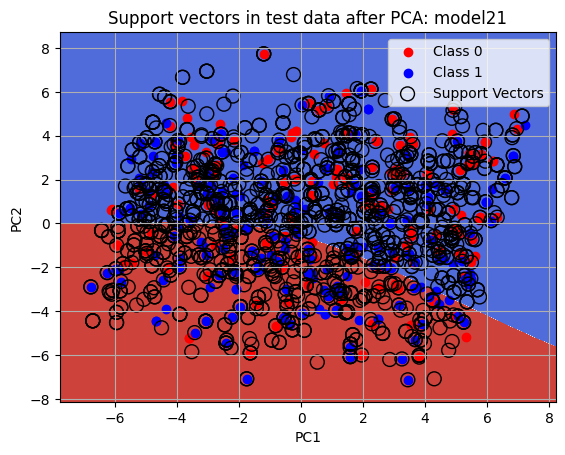

In [68]:
# Visulaiza results: model21
plt.contourf(xx, yy, z21, cmap = plt.cm.coolwarm)
plt.scatter(x_test_pca[y_pred21 == 0, 0], x_test_pca[y_pred21 == 0, 1], c = 'r', label = 'Class 0')
plt.scatter(x_test_pca[y_pred21 == 1, 0], x_test_pca[y_pred21 == 1, 1], c = 'b', label = 'Class 1')
plt.scatter(support_vectors_pca21[:, 0], support_vectors_pca21[:, 1], s = 100, linewidth = 1, facecolors = 'none', edgecolors = 'black', label = 'Support Vectors')
plt.legend(bbox_to_anchor=(1, 1), loc = 0)
plt.title('Support vectors in test data after PCA: model21')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

* The above plot shows contour background of two classes. The boundary is where the decision function is zero, as this is curved, it justifies the non-linear kernel choice.
* Also, the support vectors represent decision boundaries, as they are spread across, the 'rdf' (radial distribution function) helps capture the non-linear behaviour of the dataset.  
* Several blue/red circles are in the same color regions, indicating the correct prediction as can be seen from the key metrics, however, we can see some classes are misclassified (red circles in blue zone and vice versa)

In [70]:
# Get support vectors in 2D space: model01
support_vectors01 = svm_model01.support_vectors_
support_vectors_pca01 = pca.transform(support_vectors01)

# Predict over mesh using inverse PCA transform
z01 = svm_model01.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
z01 = z01.reshape(xx.shape)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


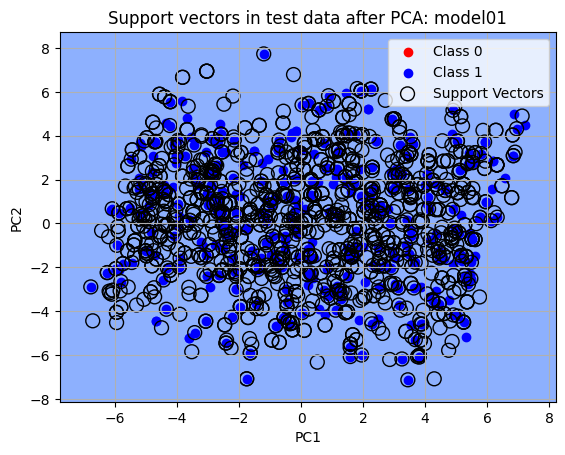

In [71]:
# Visualize results of model01
plt.contourf(xx, yy, z01, cmap = plt.cm.coolwarm)
plt.scatter(x_test_pca[y_pred01 == 0, 0], x_test_pca[y_pred01 == 0, 1], c = 'r', label = 'Class 0')
plt.scatter(x_test_pca[y_pred01 == 1, 0], x_test_pca[y_pred01 == 1, 1], c = 'b', label = 'Class 1')
plt.scatter(support_vectors_pca01[:, 0], support_vectors_pca01[:, 1], s = 100, linewidth = 1, facecolors = 'none', edgecolors = 'black', label = 'Support Vectors')
plt.legend(bbox_to_anchor=(1, 1), loc = 0)
plt.title('Support vectors in test data after PCA: model01')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

* The model01 is generated using the linear kernel, shows limited class separation after projecting the test data onto the first two principal components (PCA).
* While both classes are present, Class 0 appears sparse or possibly misclassified, which suggests poor linear separability.
* The key metrics show 100% recall, indicating False Positive as the precision is on the lower scale.   
* The distribution of support vectors across both classes — particularly near Class 1, suggests that the linear decision boundary is not sufficient to distinguish the two classes effectively. This indicates that a linear transformation is not suitable for this dataset, and a nonlinear kernel could be a better choice.

**Task 7: Comparison and Analysis**

* Compare SVM performance with various kernels (e.g., linear, polynomial, radial basis function).
* Analyze SVM strengths and weaknesses for the Mushroom dataset based on EDA and visualization results.
* Discuss practical implications of SVM in real-world classification tasks.

* 6 models are trained using the Mushroom data.
* The first model uses the original dataset with Label or OneHot encoding, whereas the second one uses the 'cleaned' original dataset by droping all duplicates from the original dataset. The reason behind building two models with duplicates and another without was to check for the effects of the additional data. In the real world, multiple entries can occur, for example, multiple purchases of the same item, may or may not represent data quality issues depending on the context. Hence, the two models, one assuming duplicates are legitimate entries and another with duplicates as mistakes.
    * Model01 - Accuracy 0.6675, Precision 0.6675, Recall 1.0
    * Model02 - Accuracy 0.6327, Precision 0.6327, Recall 1.0
* The third and fourth models are similar to the first and the second models but with one additional hyperparameter, class_weight. The reason for this hyperparameter is to resolve the False positive issue that was occurring in the first two models. Upon applying this hyperparameter, the Recall metric changed from 100% to about 50%. Furthermore, the performance of these two models was also reduced to about 55%, highlighting a trade-off between precision and recall.
    * Model11 - Accuracy 0.54, Precision 0.693, Recall 0.5581
    * Model12 - Accuracy 0.551, Precision 0.7, Recall 0.5081
* Upon tuning the models more, the fifth and sixth models are trained using non-linear transformation, the RDF kernel. The accuracy of the fifth model increased by 10% while decreased by 6% in the sixth. These key metrics suggests that removing duplicates may have discarded valuable variance and it is possible the initial assumption of treating duplicate entries as mistakes might not be a good choice for this dataset.
    * Model21 - Accuracy 0.665, Precision 0.7904, Recall 0.6779
    * Model22 - Accuracy 0.4949, Precision 0.6316, Recall 0.4839
* To better interpret model behavior, support vector visualizations were generated.
  * The distribution of support vectors, nonlinear decision boundaries, and class predictions confirmed that using a nonlinear transformation (RBF) along with balanced class weights was a justified and effective modeling choice.
  * However, some classes are misclassified and so there is room for model improvment by more fine tuning of hyperparameters.  

* SVMs are supervised Machine Learning (and regression) used in text classification analysis like spam detection, and sentiment analysis. Also, this method can be applied to image recognition.
* It uses hyperplanes to define decision boundaries. The closest datapoints to this hyperplane help defice the boundaries of classification and so support vectors are critical.
* Kernal hyperparameter maps data to higher dimensions depending on the dataset and the number of dimensions.
* SVM works best for datasets with clear separation and high dimensions.
* The downside of SVM is training time scales poorly with dataset size and noisy data reduces the efficiency of this method.